In [80]:
import pandas as pd

df_test=pd.read_csv('test.csv')
df_train=pd.read_csv('train.csv')


              Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  \
Credit_Score                                                              
Good                    5389.246647          15.083632        21.199854   
Poor                    3375.311674          18.724464        23.981447   
Standard                4242.037051          16.873754        22.079926   

              Interest_Rate  Delay_from_due_date  Num_Credit_Inquiries  \
Credit_Score                                                             
Good              73.958717            10.892753             24.483045   
Poor              76.196772            29.744051             30.794915   
Standard          69.931057            19.749577             27.192685   

              Credit_Utilization_Ratio  Total_EMI_per_month  
Credit_Score                                                 
Good                         32.686107          1477.199494  
Poor                         31.986146          1363.931423  
Stand

C:\Users\User\AppData\Local\Temp\ipykernel_20760\3937052674.py:4: DtypeWarning:

Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_20760\3937052674.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [81]:
# create a dictionary to map the string values to integer values
score_map = {'Poor': 1, 'Standard': 2, 'Good': 3}

# replace the string values with integer values using the map
df_train['Credit_Score'] = df_train['Credit_Score'].replace(score_map)
print(df_train['Credit_Score'].dtypes)

int64


C:\Users\User\AppData\Local\Temp\ipykernel_20760\1323871273.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



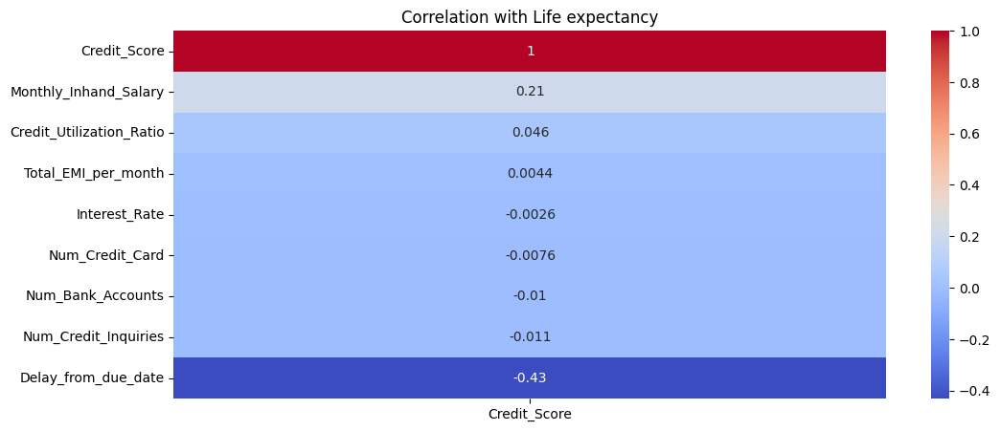

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_df = df_train.corr()[['Credit_Score']].sort_values('Credit_Score', ascending=False)


fig, ax = plt.subplots(figsize=(12, 5))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation with Life expectancy")
plt.show()

In [83]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [84]:
df_train.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [85]:
df_train['Annual_Income'].info()
df_train['Annual_Income'].describe()
print(df_train['Annual_Income'].min())
print(df_train['Annual_Income'].max())
print(df_train['Annual_Income'].sort_values().head())

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Annual_Income
Non-Null Count   Dtype 
--------------   ----- 
100000 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
10001727.0
99995.22
93418    10001727.0
25078     10003.495
25076     10003.495
25075     10003.495
25074     10003.495
Name: Annual_Income, dtype: object


In [86]:
df_train['Annual_Income'] = pd.to_numeric(df_train['Annual_Income'].str.replace('[^\d.]', ''))


C:\Users\User\AppData\Local\Temp\ipykernel_20760\3976904185.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [88]:
print(df_train['Monthly_Inhand_Salary'].sort_values().head())
print(df_train['Monthly_Inhand_Salary'].max())

83645    303.645417
83647    303.645417
83646    303.645417
83644    303.645417
83643    303.645417
Name: Monthly_Inhand_Salary, dtype: float64
15204.633333333331


In [89]:
# Calculate the correlation coefficient
df_filtered = df_train[df_train['Annual_Income'] < 180000]
corr_coef = df_filtered['Annual_Income'].corr(df_train['Monthly_Inhand_Salary'])

print('Correlation coefficient:', corr_coef)

Correlation coefficient: 0.9981917378223611


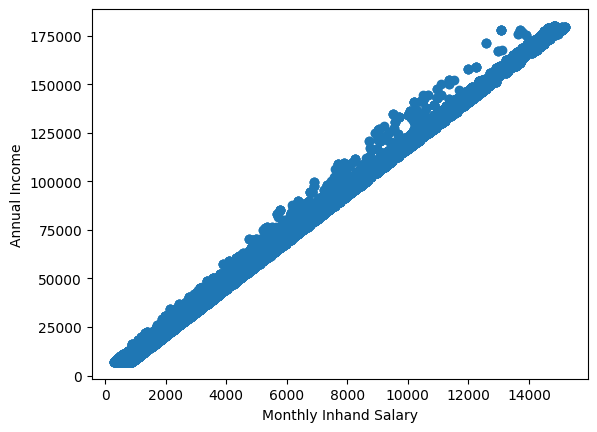

In [90]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the data for annual incomes less than 100k
df_filtered = df_train[df_train['Annual_Income'] < 180000]

# Plot a scatter plot of Monthly_Inhand_Salary against Annual_Income
plt.scatter(df_filtered['Monthly_Inhand_Salary'], df_filtered['Annual_Income'])
plt.xlabel('Monthly Inhand Salary')
plt.ylabel('Annual Income')
plt.show()

In [91]:
print(df_train['Monthly_Inhand_Salary'].isnull().sum())
print(df_train[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] < 180000)]['Annual_Income'])


15002
1        19114.12
2        19114.12
3        19114.12
5        19114.12
11       34847.84
           ...   
99944    59146.36
99955    38321.39
99963    42903.79
99975    16680.35
99978    37188.10
Name: Annual_Income, Length: 14855, dtype: float64


In [92]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


# Filter the data
df_filtered = df_train[df_train['Annual_Income'] < 180000]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    df_filtered.loc[df_filtered['Monthly_Inhand_Salary'].notnull(), 'Annual_Income'].values.reshape(-1, 1),
    df_filtered.loc[df_filtered['Monthly_Inhand_Salary'].notnull(), 'Monthly_Inhand_Salary'].values.reshape(-1, 1),
    test_size=0.3,
    random_state=42
)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on testing set
y_pred = model.predict(X_test)

# Print evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print('MSE:', mse)
print('RMSE:', rmse)
print('R2:', r2)

MSE: 36320.81283907548
RMSE: 190.58020054317154
R2: 0.9963847758800946


In [93]:
# Filter the data
df_filtered = df_train[df_train['Annual_Income'] <= 180000]

# Split the data into training and testing sets
X_train = df_train.loc[df_train['Monthly_Inhand_Salary'].notnull() & (df_train['Annual_Income'] <= 180000), 'Annual_Income'].values.reshape(-1, 1)
y_train = df_train.loc[df_train['Monthly_Inhand_Salary'].notnull() & (df_train['Annual_Income'] <= 180000), 'Monthly_Inhand_Salary'].values.reshape(-1, 1)

# Split the data into testing set
X_test = df_train.loc[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] <= 180000), 'Annual_Income'].values.reshape(-1, 1)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict the missing values
y_pred = model.predict(X_test)

# Fill the missing values with predicted values
df_train.loc[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] <= 180000), 'Monthly_Inhand_Salary'] = y_pred

# Fill the remaining missing values with mean
mean = df_train['Monthly_Inhand_Salary'].mean()
df_train['Monthly_Inhand_Salary'] = df_train['Monthly_Inhand_Salary'].fillna(mean)

print('Monthly_Inhand_Salary null values count:',df_train['Monthly_Inhand_Salary'].isnull().sum())


Monthly_Inhand_Salary null values count: 0


In [94]:
print(df_train['Num_Bank_Accounts'].info())
print(df_train['Num_Bank_Accounts'].describe())
print(df_train['Num_Bank_Accounts'].min())
print(df_train['Num_Bank_Accounts'].max())
print(df_train['Num_Bank_Accounts'].sort_values().head(10000))
print(df_train['Num_Bank_Accounts'].sort_values().tail(10000))


<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_Bank_Accounts
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.000000
mean         17.091280
std         117.404834
min          -1.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64
-1
1798
30334   -1
30335   -1
47215   -1
47214   -1
47213   -1
        ..
50289    2
50290    2
50291    2
50292    2
50293    2
Name: Num_Bank_Accounts, Length: 10000, dtype: int64
21358       9
21359       9
25688       9
2525        9
20549       9
         ... 
35195    1793
29242    1794
69059    1794
20277    1798
64537    1798
Name: Num_Bank_Accounts, Length: 10000, dtype: int64


In [95]:
import plotly.express as px

fig = px.histogram(df_train, x='Num_Bank_Accounts', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Bank Accounts')
fig.show()




In [96]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Num_Bank_Accounts'] > 12].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 11'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()




In [97]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Num_Bank_Accounts'].median()

# Replace the values in the specified rows with median value
df_train.loc[df_train['Num_Bank_Accounts'] > 12, 'Num_Bank_Accounts'] = median_value
df_train[df_train['Num_Bank_Accounts'] > 12]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [98]:

print(df_train['Num_Credit_Card'].info())
print(df_train['Num_Credit_Card'].describe())
print(df_train['Num_Credit_Card'].min())
print(df_train['Num_Credit_Card'].max())
print(df_train['Num_Credit_Card'].sort_values().tail(1000))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_Credit_Card
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.00000
mean         22.47443
std         129.05741
min           0.00000
25%           4.00000
50%           5.00000
75%           7.00000
max        1499.00000
Name: Num_Credit_Card, dtype: float64
0
1499
57672     849
94898     849
94436     849
65264     849
77070     849
         ... 
77711    1498
18343    1498
62075    1498
25015    1499
72123    1499
Name: Num_Credit_Card, Length: 1000, dtype: int64


In [99]:
import plotly.express as px

fig = px.histogram(df_train, x='Num_Credit_Card', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards')
fig.show()

In [100]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Num_Credit_Card'] >12].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 12'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [101]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Num_Credit_Card'].median()


# Replace the values in the specified rows with median value
df_train.loc[df_train['Num_Credit_Card'] > 12, 'Num_Credit_Card'] = median_value
df_train[df_train['Num_Credit_Card'] > 12]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [102]:

print(df_train['Interest_Rate'].info())
print(df_train['Interest_Rate'].describe())
print(df_train['Interest_Rate'].min())
print(df_train['Interest_Rate'].max())
print(df_train['Interest_Rate'].sort_values().tail(2000))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Interest_Rate
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.000000
mean         72.466040
std         466.422621
min           1.000000
25%           8.000000
50%          13.000000
75%          20.000000
max        5797.000000
Name: Interest_Rate, dtype: float64
1
5797
40109     136
91544     137
26737     140
14186     142
58772     144
         ... 
77710    5775
88505    5776
23512    5788
73583    5789
71641    5797
Name: Interest_Rate, Length: 2000, dtype: int64


In [103]:
import plotly.express as px

# Filter the dataframe to include only rows where Interest_Rate is greater than 34
df_filtered = df_train[df_train['Interest_Rate'] > 34]

# Create a histogram of the filtered data
fig = px.histogram(df_filtered, x='Interest_Rate', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards with Interest Rate > 30',width=950)
fig.show()
num_values_bigger_than_34 = df_train[df_train['Interest_Rate'] > 34]['Interest_Rate'].count()
print(num_values_bigger_than_34)

2034


In [104]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Interest_Rate'] > 34].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 34'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [105]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Interest_Rate'].median()


# Replace the values in the specified rows with median value
df_train.loc[df_train['Interest_Rate'] > 34, 'Interest_Rate'] = median_value
df_train[df_train['Interest_Rate'] > 34]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [106]:
print(df_train['Num_of_Loan'].info())
print(df_train['Num_of_Loan'].describe())
print(df_train['Num_of_Loan'].min())
print(df_train['Num_of_Loan'].max())
print(df_train['Num_of_Loan'].sort_values().tail(50))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_of_Loan
Non-Null Count   Dtype 
--------------   ----- 
100000 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
None
count     100000
unique       434
top            3
freq       14386
Name: Num_of_Loan, dtype: object
-100
9_
59049    9_
32571    9_
16833    9_
73758    9_
23602    9_
10853    9_
42905    9_
10862    9_
391      9_
18190    9_
23459    9_
23457    9_
56590    9_
47704    9_
22013    9_
78897    9_
18747    9_
72482    9_
86460    9_
82063    9_
79644    9_
70380    9_
65360    9_
70376    9_
91617    9_
91618    9_
79641    9_
91621    9_
68060    9_
3353     9_
52182    9_
19107    9_
21802    9_
70283    9_
40307    9_
10399    9_
43397    9_
37534    9_
13213    9_
28543    9_
8125     9_
32512    9_
54127    9_
26669    9_
89777    9_
97773    9_
21777    9_
32523    9_
4907     9_
17302    9_
Name: Num_of_Loan, dtype: object


In [107]:
df_train['Num_of_Loan'] = df_train['Num_of_Loan'].apply(lambda x: x[:-1] if not x[-1].isdigit() else x)

In [108]:
# Assuming the column name is 'Num_of_Loan'
num_loan = df_train['Num_of_Loan']

# Convert to numeric
num_loan_numeric = pd.to_numeric(num_loan, errors='coerce')

df_train['Num_of_Loan'] = pd.to_numeric(df_train['Num_of_Loan'], errors='coerce')


# Check how many rows are numeric
print('Number of numeric rows:', num_loan_numeric.notnull().sum())

print(df_train['Num_of_Loan'].describe())



Number of numeric rows: 100000
count    100000.000000
mean          3.009960
std          62.647879
min        -100.000000
25%           1.000000
50%           3.000000
75%           5.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64


In [109]:
import plotly.express as px

# Filter the dataframe to include only rows where Interest_Rate is greater than 9
df_filtered = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]


# Create a histogram of the filtered data
fig = px.histogram(df_filtered, x='Num_of_Loan', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards with Nummer of Loan > 9 and Nummer of Loan < 0  ',width=950)
fig.show()
num_values_bigger_than_9 = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]['Num_of_Loan'].count()
print(num_values_bigger_than_9)

4348


In [110]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 9 and lower then 0'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [116]:
df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]['Type_of_Loan']
df_train

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label,Num_of_Loan_Types
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,3,All bank account,4
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1590.839311,3,...,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,3,All bank account,4
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,1590.839311,3,...,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,3,All bank account,4
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1590.839311,3,...,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,3,All bank account,4
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,3,All bank account,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,1,All bank account,2
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,1,All bank account,2
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,1,All bank account,2
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,2,All bank account,2


In [112]:
print(df_train['Type_of_Loan'].info())
print(df_train['Type_of_Loan'].describe())
print('Sum of nan values:',df_train['Type_of_Loan'].isnull().sum())
freq_table = df_train['Type_of_Loan'].value_counts()
print(freq_table.tail(20))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Type_of_Loan
Non-Null Count  Dtype 
--------------  ----- 
88592 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
None
count             88592
unique             6260
top       Not Specified
freq               1408
Name: Type_of_Loan, dtype: object
Sum of nan values: 11408
Home Equity Loan, Payday Loan, Credit-Builder Loan, Auto Loan, and Payday Loan                                                                  8
Debt Consolidation Loan, Personal Loan, Mortgage Loan, Personal Loan, Not Specified, Mortgage Loan, and Home Equity Loan                        8
Auto Loan, Credit-Builder Loan, Student Loan, and Student Loan                                                                                  8
Personal Loan, Student Loan, Not Specified, Debt Consolidation Loan, and Student Loan                                                           8
Mortgage Loan, Credit-Builder Loan, Mortgage

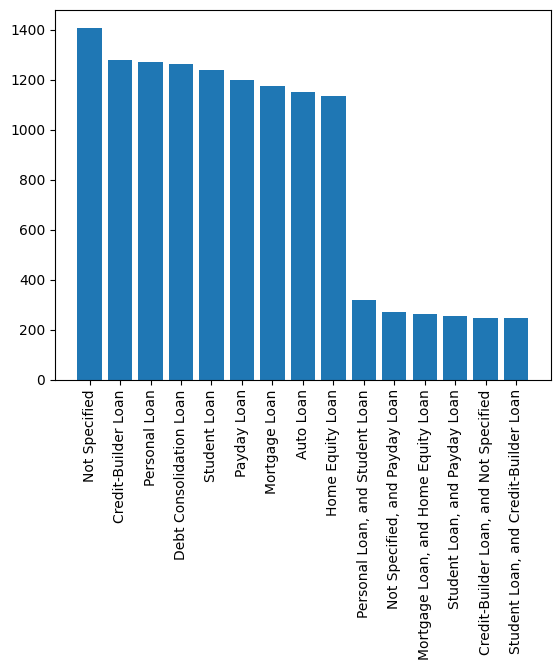

In [113]:
value_counts = df_train['Type_of_Loan'].value_counts()
value_counts_filtered = value_counts[value_counts > 240]

plt.bar(value_counts_filtered.index, value_counts_filtered.values)
plt.xticks(rotation=90)
plt.show()

In [114]:
value=df_train['Num_of_Loan'].median()
df_train['Type_of_Loan'] = df_train['Type_of_Loan'].fillna(value)

# Count number of elements separated by comma
num_elements = df_train['Type_of_Loan'].astype(str).apply(lambda x: x.count(',') + 1 if x!= 'Not Specified'  else 0)

# Create new column
df_train = df_train.assign(Num_of_Loan_Types=num_elements)

# Replace the values in the specified rows with Num_of_Loan_Types cloumn value
df_train.loc[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0), 'Num_of_Loan'] = df_train['Num_of_Loan_Types']
print(df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)])


# Check the correlation between the two columns
corr = df_train['Num_of_Loan'].corr(df_train['Num_of_Loan_Types'])

print('Correlation between Num_of_Loan and Num_of_Loan_Types_int:', corr)
df_train['Num_of_Loan'].describe()

Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score, Label, Num_of_Loan_Types]
Index: []

[0 rows x 30 columns]
Correlation between Num_of_Loan and Num_of_Loan_Types_int: 0.9913333441480534


count    100000.000000
mean          3.536980
std           2.441264
min           0.000000
25%           2.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: Num_of_Loan, dtype: float64

In [117]:
df_train=df_train.drop('Num_of_Loan_Types',axis=1)
df_train=df_train.drop('Annual_Income',axis=1)
df_train=df_train.drop('Type_of_Loan',axis=1)

C:\Users\User\AppData\Local\Temp\ipykernel_20760\2117790107.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



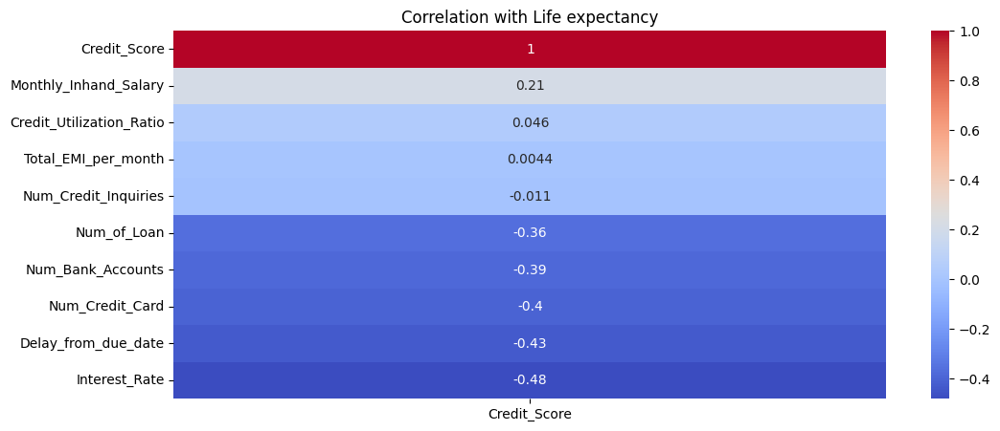

In [118]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr_df = df_train.corr()[['Credit_Score']].sort_values('Credit_Score', ascending=False)


fig, ax = plt.subplots(figsize=(12, 5))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation with Life expectancy")
plt.show()

<br>
<br>
<br>

# Juan Part

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

print('setup')

In [ ]:
df_test = pd.read_csv('data/train.csv', low_memory=False)

df = df_test[['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio']]

def dirty_data(df):
    dirty = []
    columns = df.columns
    for col in columns:
        dtype = df[col].dtypes
        nunique = df[col].nunique()
        null = df[col].isnull().sum()
        duplicates = df[col].duplicated().sum()
        dirty.append([col,dtype,nunique,null,duplicates])
    df_dirty_data_finding = pd.DataFrame(dirty)
    df_dirty_data_finding.columns = ['column','dtype','nunique','null','duplicates']
    return df_dirty_data_finding

def cleaning_Null_columns(df_column):
  df_column.fillna(-99999, inplace = True)
  return df_column.value_counts(dropna = False)

def fix_nums(num):
    try : 
        return float(num.replace("_",""))
    except :
        return np.NaN
 

        
def plot_boxplots(df, ncols=3, color="", figsize=(10, 10)):
    try :
        # Calculate number of rows and columns
        nrows = (len(df.columns) - 1) // ncols + 1
        
        # Create figure and subplots
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        
        # Loop through columns and plot boxplot
        for i, column in enumerate(df.columns):
            ax = axes.flat[i]
            sns.boxplot(df[column], ax=ax, color=color, whis=1.5, saturation=0.5, width=0.5, orient='h', notch=True, showcaps=False)
            ax.axvline(df[column].median(), color='r', linestyle='--')
            ax.set_title(column)
            ax.legend([f'Median: {df[column].median():.2f}'], loc='best')
        
        for ax in axes.flat:
            ax.grid(True)
        
        # Remove any unused axes
        if len(df.columns) % ncols != 0:
            for i in range(len(df.columns) % ncols, ncols):
                fig.delaxes(axes.flat[-i])
        
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error: {e}")
        
        
def process_column(df_column):
    try:
        # Calculate the 95 percentile
        q95 = df_test[df_column.name].quantile(0.95)

        # Replace values above the 95 percentile with the median value
        df_test_test = df_test[df_test[df_column.name] <= q95][df_column.name]
        median_col = int(df_test_test.median())

        df_test.loc[df_test[df_column.name] > q95, df_column.name] = median_col
        df_test.loc[df_test[df_column.name] == -99999, df_column.name] = median_col  
        
    except Exception as e:
        print(f"Error: {e}")      


def df_process_data(df):
    try:
        processed = []
        columns = df.columns
        for col in columns:
            # Check for outliers and replace with median
            q95 = df[col].quantile(0.95).round(1)
            df_test = df[df[col] <= q95][col]
            median_col = int(df_test.median())
            df.loc[df[col] > q95, col] = median_col
            df.loc[df[col] == -99999, col] = median_col
            processed.append([col,q95,median_col])
        df_processed_data_finding = pd.DataFrame(processed, columns=['column','quantile95','median_col'])
        return df_processed_data_finding
    except Exception as e:
        print(f"Error: {e}")

In [ ]:
import missingno as msno

msno.matrix(df, figsize=(16, 3), color = (0.0, 0.16, 0.25))
plt.title('Displays missing values in the DataFrame', fontsize=16)
plt.show()

dirty_data(df)

In [ ]:
df_test['Credit_Mix'] = pd.factorize(df_test['Credit_Mix'], sort=True)[0]
df_test['Credit_Mix'] = df_test['Credit_Mix'].astype(int)

num_to_fix = ['Num_of_Delayed_Payment', 'Changed_Credit_Limit','Outstanding_Debt']

for col in num_to_fix :
    df_test[col] = df_test[col].apply(fix_nums)
    
cleaning_Null_columns(df_test['Num_of_Delayed_Payment'])
cleaning_Null_columns(df_test['Changed_Credit_Limit'])
cleaning_Null_columns(df_test['Num_Credit_Inquiries'])
# dirty_df_test_finding(df)

df = df_test[['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio']]

dirty_data(df)

<br>
<br>

# EDA (Box plot)

In [ ]:
plot_boxplots(df,  ncols=3, color='cyan')

In [ ]:
df.apply(process_column)
df_process_data(df)

<br>

## Processed data (Box plot) 

In [ ]:
plot_boxplots(df,  ncols=3, color='yellow')

In [ ]:
# df.to_csv("data/process_data_juan.csv", index = False)

# juan = pd.read_csv("juan_process_data.csv")
# del juan['Unnamed: 0']
# juan.info()